In [76]:
import pandas as pd
import pandas_profiling as pp
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.preprocessing import StandardScaler

In [108]:
train = pd.read_csv('dataset_treino.csv')
test = pd.read_csv('dataset_teste.csv')

In [81]:
train.shape,test.shape

((114321, 133), (114393, 132))

In [82]:
train.head()

,ID,target,v1,v2,v3,v4,v5,v6,v7,v8,...,v122,v123,v124,v125,v126,v127,v128,v129,v130,v131
0,3,1,1.335739,8.727474,C,3.921026,7.915266,2.599278,3.176895,0.012941,...,8.000000,1.989780,0.035754,AU,1.804126,3.113719,2.024285,0,0.636365,2.857144
1,4,1,NaN,NaN,C,NaN,9.191265,NaN,NaN,2.301630,...,NaN,NaN,0.598896,AF,NaN,NaN,1.957825,0,NaN,NaN
2,5,1,0.943877,5.310079,C,4.410969,5.326159,3.979592,3.928571,0.019645,...,9.333333,2.477596,0.013452,AE,1.773709,3.922193,1.120468,2,0.883118,1.176472
3,6,1,0.797415,8.304757,C,4.225930,11.627438,2.097700,1.987549,0.171947,...,7.018256,1.812795,0.002267,CJ,1.415230,2.954381,1.990847,1,1.677108,1.034483
4,8,1,NaN,NaN,C,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Z,NaN,NaN,NaN,0,NaN,NaN


In [83]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114321 entries, 0 to 114320
Columns: 133 entries, ID to v131
dtypes: float64(108), int64(6), object(19)
memory usage: 116.0+ MB


In [84]:
train_features_numericas = train.describe().columns
train.describe()

,ID,target,v1,v2,v4,v5,v6,v7,v8,v9,...,v121,v122,v123,v124,v126,v127,v128,v129,v130,v131
count,114321.000000,114321.000000,6.448900e+04,6.452500e+04,6.452500e+04,6.569700e+04,6.448900e+04,6.448900e+04,6.570200e+04,6.447000e+04,...,6.448100e+04,6.447000e+04,63643.000000,6.570200e+04,6.448900e+04,6.448900e+04,6.569700e+04,114321.000000,6.447800e+04,6.442600e+04
mean,114228.928228,0.761199,1.630686e+00,7.464411e+00,4.145098e+00,8.742359e+00,2.436402e+00,2.483921e+00,1.496569e+00,9.031859e+00,...,2.737596e+00,6.822439e+00,3.549938,9.198120e-01,1.672658e+00,3.239542e+00,2.030373e+00,0.310144,1.925763e+00,1.739389e+00
std,65934.487362,0.426353,1.082813e+00,2.961676e+00,1.148263e+00,2.036018e+00,5.999653e-01,5.894485e-01,2.783003e+00,1.930262e+00,...,1.356294e+00,1.795978e+00,2.604704,2.099407e+00,5.031683e-01,1.625988e+00,1.074232e+00,0.693262,1.264497e+00,1.134702e+00
min,3.000000,0.000000,-9.996497e-07,-9.817614e-07,-6.475929e-07,-5.287068e-07,-9.055091e-07,-9.468765e-07,-7.783778e-07,-9.828757e-07,...,-9.820642e-07,-9.978497e-07,0.019139,-9.994953e-07,-9.564174e-07,-9.223798e-07,8.197812e-07,0.000000,-9.901257e-07,-9.999134e-07
25%,57280.000000,1.000000,9.135798e-01,5.316428e+00,3.487398e+00,7.605918e+00,2.065064e+00,2.101477e+00,8.658986e-02,7.853659e+00,...,1.786965e+00,5.647712e+00,1.963315,2.053777e-02,1.417600e+00,2.101900e+00,1.393830e+00,0.000000,1.106172e+00,1.012658e+00
50%,114189.000000,1.000000,1.469550e+00,7.023803e+00,4.205991e+00,8.670867e+00,2.412790e+00,2.452166e+00,3.860317e-01,9.059582e+00,...,2.436195e+00,6.749117e+00,2.739239,1.398639e-01,1.614802e+00,2.963620e+00,1.798436e+00,0.000000,1.560138e+00,1.589403e+00
75%,171206.000000,1.000000,2.136128e+00,9.465497e+00,4.833250e+00,9.771353e+00,2.775285e+00,2.834285e+00,1.625246e+00,1.023256e+01,...,3.379175e+00,7.911392e+00,4.075361,8.718333e-01,1.843886e+00,4.108146e+00,2.390158e+00,0.000000,2.332425e+00,2.261905e+00
max,228713.000000,1.000000,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,...,2.000000e+01,2.000000e+01,19.686069,2.000000e+01,1.563161e+01,2.000000e+01,2.000000e+01,11.000000,2.000000e+01,2.000000e+01


In [85]:
train_features_categoricas = train.describe(include='O').columns
train.describe(include='O')

,v3,v22,v24,v30,v31,v47,v52,v56,v66,v71,v74,v75,v79,v91,v107,v110,v112,v113,v125
count,110864,113821,114321,54211,110864,114321,114318,107439,114321,114321,114321,114321,114321,114318,114318,114321,113939,59017,114244
unique,3,18210,5,7,3,10,12,122,3,9,3,4,18,7,7,3,22,36,90
top,C,AGDF,E,C,A,C,J,BW,A,F,B,D,C,A,E,A,F,G,BM
freq,110584,2386,55177,32178,88347,55425,11103,11351,70353,75094,113560,75087,34561,27079,27079,55688,21671,16252,5759


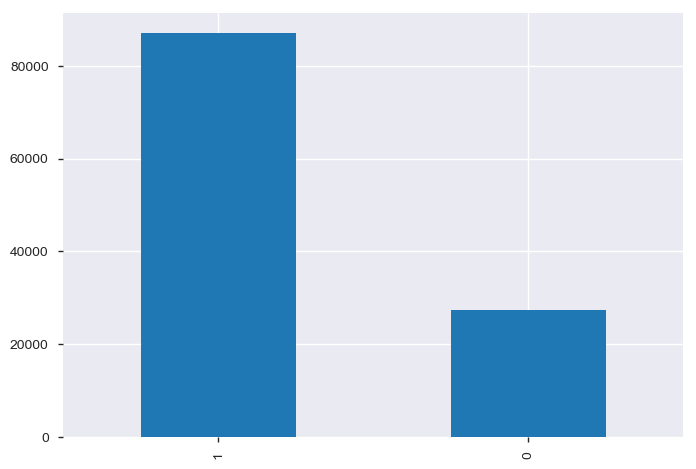

In [86]:
pd.value_counts(train['target']).plot.bar()

#### % de missing values

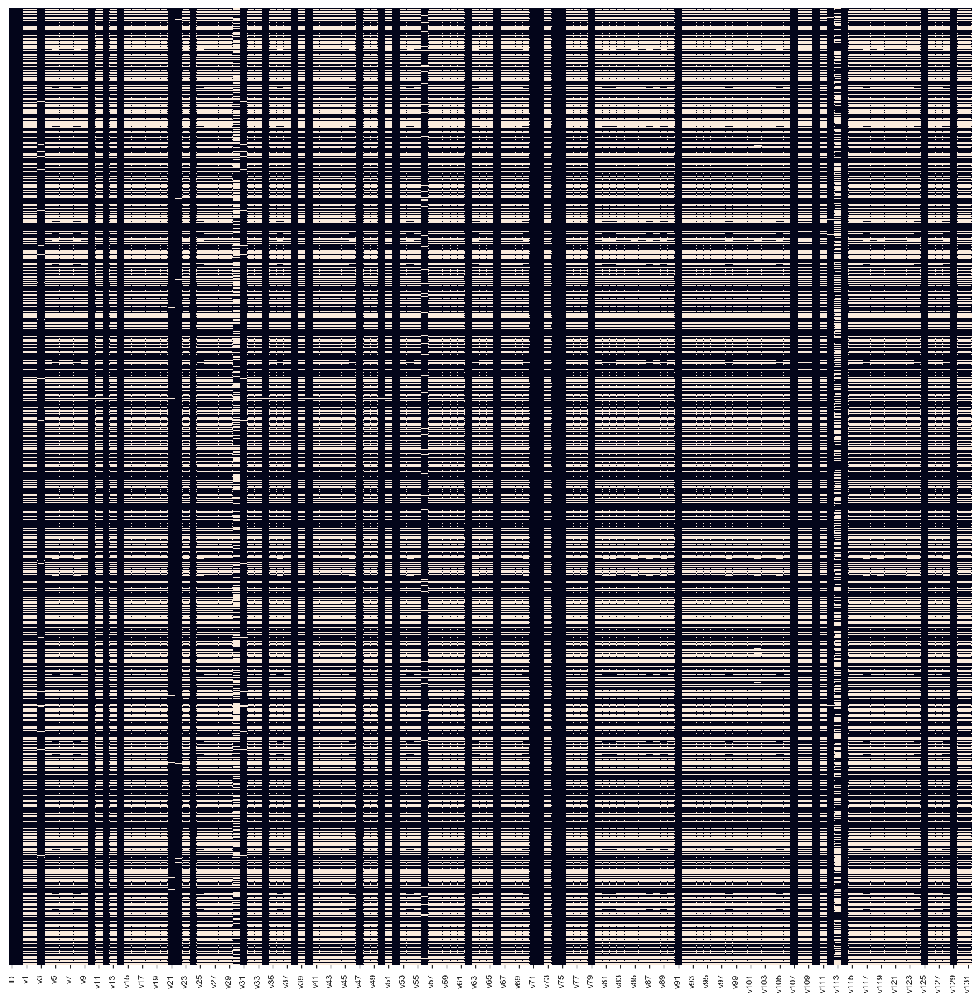

In [87]:
plt.figure(figsize=(20, 20))
sns.heatmap(train.isnull(),yticklabels= False,cbar=False)

In [22]:
pp.ProfileReport(train)

Number of variables,133
Number of observations,114321
Total Missing (%),23.7%
Total size in memory,116.0 MiB
Average record size in memory,1.0 KiB
Numeric,81
Categorical,19
Boolean,1
Date,0
Text (Unique),0
Rejected,32


## Limpeza

In [109]:
train1= train.copy()
test1= test.copy()

##### Separar o target das features 

In [110]:
y_train = train1.target
train1 = train1.drop(['ID','target'],axis=1)
test1 = test1.drop(['ID'],axis=1)

#### remover as variaveis com alta correlacao

In [111]:
f_corr = ['v13','v89','v64','v83','v34','v97','v10','v83','v43','v109','v108','v8','v15','v29','v26','v41','v11','v46',
                'v33','v54','v17','v20','v32','v67','v55','v63','v92','v25']

In [112]:
train1 = train1.drop(f_corr,axis=1)
test1 = test1.drop(f_corr,axis=1)

In [92]:
pp.ProfileReport(train)

Number of variables,106
Number of observations,114321
Total Missing (%),31.9%
Total size in memory,92.5 MiB
Average record size in memory,848.0 B
Numeric,86
Categorical,19
Boolean,1
Date,0
Text (Unique),0
Rejected,0


##### Fillna das features numéricas com mediana 

In [113]:
from sklearn.impute import SimpleImputer as si
imp = si(missing_values=np.nan , strategy = 'median')

In [114]:
train1_features_numericas = train1.describe().columns

In [115]:
for i in train1_features_numericas:
    train1[i] = imp.fit_transform(train1[[i]])
    test1[i] = imp.fit_transform(test1[[i]])

##### FIllna das features categóricas com a moda 

In [116]:
imp = si(missing_values=np.nan , strategy = 'most_frequent')

In [117]:
train1_features_categoricas = train1.describe(include='O').columns

In [118]:
for i in train1_features_categoricas:
    train1[i] = imp.fit_transform(train1[[i]])
    test1[i] = imp.fit_transform(test1[[i]])

In [119]:
train1.head()

,v1,v2,v3,v4,v5,v6,v7,v9,v12,v14,...,v122,v123,v124,v125,v126,v127,v128,v129,v130,v131
0,1.335739,8.727474,C,3.921026,7.915266,2.599278,3.176895,9.999999,6.085711,11.636387,...,8.000000,1.989780,0.035754,AU,1.804126,3.113719,2.024285,0.0,0.636365,2.857144
1,1.469550,7.023803,C,4.205991,9.191265,2.412790,2.452166,9.059582,6.507647,11.636386,...,6.749117,2.739239,0.598896,AF,1.614802,2.963620,1.957825,0.0,1.560138,1.589403
2,0.943877,5.310079,C,4.410969,5.326159,3.979592,3.928571,12.666667,6.384670,9.603542,...,9.333333,2.477596,0.013452,AE,1.773709,3.922193,1.120468,2.0,0.883118,1.176472
3,0.797415,8.304757,C,4.225930,11.627438,2.097700,1.987549,8.965516,9.646653,14.094723,...,7.018256,1.812795,0.002267,CJ,1.415230,2.954381,1.990847,1.0,1.677108,1.034483
4,1.469550,7.023803,C,4.205991,8.670867,2.412790,2.452166,9.059582,6.320087,10.991098,...,6.749117,2.739239,0.139864,Z,1.614802,2.963620,1.798436,0.0,1.560138,1.589403


##### Visualização dos dados nulos após as inferencias aos dados missing

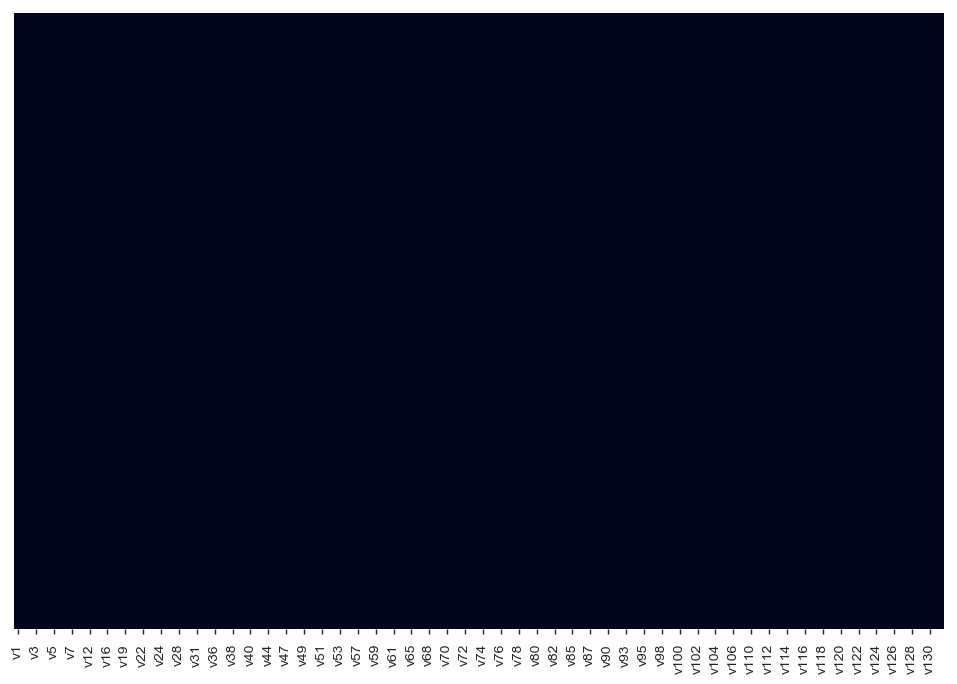

In [120]:
plt.figure(figsize=(12, 8))
sns.heatmap(train1.isnull(),yticklabels= False,cbar=False)

#### Ajustar colunas com alta cardinalidades

In [121]:
train1.v125.value_counts()/train1.shape[0]

BM    0.051049
AK    0.046684
BJ    0.039057
CG    0.033467
AP    0.029828
BY    0.028962
V     0.028289
H     0.028096
K     0.024799
G     0.022690
E     0.022052
L     0.021886
BW    0.021676
BD    0.021448
AZ    0.021133
B     0.020766
AR    0.019498
CD    0.018011
AC    0.017013
Z     0.013952
AN    0.013462
A     0.013366
CA    0.013322
BK    0.012920
P     0.012797
CJ    0.012649
BU    0.011975
BX    0.011345
R     0.010645
BL    0.010619
        ...   
AO    0.005633
BR    0.005616
M     0.005563
CK    0.005450
T     0.005380
AA    0.004741
AV    0.004706
C     0.004496
BF    0.004470
BP    0.004409
AD    0.004251
AQ    0.004102
CL    0.004033
AM    0.003884
AS    0.003735
BT    0.003560
CI    0.003473
BC    0.003446
BG    0.003105
BA    0.003053
AH    0.003000
I     0.002213
O     0.002169
BS    0.002099
F     0.001933
AB    0.001653
AJ    0.000717
BB    0.000595
AX    0.000114
BZ    0.000026
Name: v125, Length: 90, dtype: float64

In [122]:
train1.v22.value_counts()/train1.shape[0]

AGDF    0.025245
YGJ     0.018536
QKI     0.005843
PWR     0.005677
HZE     0.003700
MNZ     0.003341
PTO     0.003062
ROZ     0.003009
YOD     0.002650
GBS     0.002615
VZF     0.002589
AJQ     0.002204
WNI     0.002134
HDD     0.002126
NRT     0.002082
PFR     0.001977
YEP     0.001959
ADDF    0.001854
VVI     0.001846
QVR     0.001837
WRI     0.001811
ABOF    0.001784
PSE     0.001741
NGS     0.001723
ACWE    0.001662
TVR     0.001592
PTJ     0.001557
ADMP    0.001505
UAG     0.001478
AGON    0.001461
          ...   
AGWJ    0.000009
UWV     0.000009
ZGZ     0.000009
AAUK    0.000009
RMP     0.000009
AVK     0.000009
NK      0.000009
TKO     0.000009
DVP     0.000009
EMR     0.000009
FGH     0.000009
QAZ     0.000009
GQX     0.000009
AABJ    0.000009
UBG     0.000009
CJL     0.000009
UIM     0.000009
DYC     0.000009
XFD     0.000009
OAA     0.000009
ZHF     0.000009
HVV     0.000009
ZGJ     0.000009
LAI     0.000009
OXB     0.000009
GVI     0.000009
ENQ     0.000009
HRT     0.0000

In [123]:
train1.v56.value_counts()/train1.shape[0]

BW    0.159490
DI    0.089712
AS    0.077256
BZ    0.062753
AW    0.055712
DO    0.046264
P     0.043710
DP    0.040649
CY    0.033502
CN    0.032759
BL    0.031228
AF    0.020600
BJ    0.020512
AG    0.018929
DX    0.018326
DY    0.017241
BV    0.016611
U     0.014652
DJ    0.014521
N     0.014328
DS    0.013235
V     0.012920
BX    0.012133
DH    0.011354
DF    0.009788
AL    0.008450
DR    0.008152
BK    0.008056
BM    0.007671
G     0.006735
        ...   
BN    0.000026
B     0.000026
BE    0.000026
DT    0.000026
O     0.000017
AJ    0.000017
CD    0.000017
AE    0.000017
BO    0.000017
M     0.000017
AB    0.000017
BT    0.000017
DD    0.000017
H     0.000017
AM    0.000017
L     0.000017
X     0.000009
CZ    0.000009
AX    0.000009
CE    0.000009
D     0.000009
CG    0.000009
DC    0.000009
I     0.000009
CJ    0.000009
T     0.000009
AP    0.000009
DB    0.000009
BC    0.000009
CK    0.000009
Name: v56, Length: 122, dtype: float64

#### diminuiondo a cardinalizdade do v56

In [124]:
lista = (train1.v56.value_counts()/train1.shape[0]).head(12).index.tolist()

In [125]:
train1.v56 = train1.v56.apply(lambda x: 'OUTROS' if x not in lista else x)

#### removendo as outras features com alta cardinalidade

In [126]:
train1.drop(['v125','v22'],axis=1,inplace=True)

##### Report geral dos dados

In [127]:
pp.ProfileReport(train1)

Number of variables,102
Number of observations,114321
Total Missing (%),0.0%
Total size in memory,89.0 MiB
Average record size in memory,816.0 B
Numeric,85
Categorical,17
Boolean,0
Date,0
Text (Unique),0
Rejected,0


##### Escalar as features numéricas

In [128]:
scaler = StandardScaler()

train1_features_numericas = train1.describe().columns

train1[train1_features_numericas] = scaler.fit_transform(train1[train1_features_numericas])
test1[train1_features_numericas] = scaler.fit_transform(test1[train1_features_numericas])

display(train1.head())

,v1,v2,v3,v4,v5,v6,v7,v9,v12,v14,...,v121,v122,v123,v124,v126,v127,v128,v129,v130,v131
0,-0.274981,0.650788,C,-0.290315,-0.516042,0.384166,1.595546,0.659528,-0.860653,-0.317115,...,-1.750960,0.896493,-0.605014,-0.337299,0.413424,-0.004516,0.112555,-0.447372,-1.168806,1.383783
1,-0.111233,-0.111233,C,0.039817,0.310469,-0.029548,-0.040436,0.010785,-0.404098,-0.317116,...,-0.165128,-0.030647,-0.227398,0.006585,-0.086113,-0.126661,0.031739,-0.447372,-0.213300,-0.098853
2,-0.754513,-0.877751,C,0.277283,-2.193100,3.446332,3.292359,2.499116,-0.537165,-1.724985,...,-0.356860,1.884745,-0.359227,-0.350918,0.333169,0.653389,-0.986483,2.437555,-0.913577,-0.581781
3,-0.933742,0.461714,C,0.062916,1.888466,-0.728561,-1.089251,-0.054106,2.992463,1.385433,...,-0.631055,0.168835,-0.694188,-0.357747,-0.612689,-0.134179,0.071894,0.995092,-0.092312,-0.747838
4,-0.111233,-0.111233,C,0.039817,-0.026612,-0.029548,-0.040436,0.010785,-0.607046,-0.764018,...,-0.165128,-0.030647,-0.227398,-0.273724,-0.086113,-0.126661,-0.162077,-0.447372,-0.213300,-0.098853


##### get_dummies

In [129]:
train1 = pd.get_dummies(train1)
test1 = pd.get_dummies(test1)
display(train1.head())

,v1,v2,v4,v5,v6,v7,v9,v12,v14,v16,...,v113_Q,v113_R,v113_S,v113_T,v113_U,v113_V,v113_W,v113_X,v113_Y,v113_Z
0,-0.274981,0.650788,-0.290315,-0.516042,0.384166,1.595546,0.659528,-0.860653,-0.317115,2.710248,...,0,0,0,0,0,0,0,0,0,0
1,-0.111233,-0.111233,0.039817,0.310469,-0.029548,-0.040436,0.010785,-0.404098,-0.317116,0.003732,...,0,0,0,0,0,0,0,0,0,0
2,-0.754513,-0.877751,0.277283,-2.193100,3.446332,3.292359,2.499116,-0.537165,-1.724985,0.710406,...,0,0,0,0,0,0,0,0,0,0
3,-0.933742,0.461714,0.062916,1.888466,-0.728561,-1.089251,-0.054106,2.992463,1.385433,0.438877,...,0,0,0,0,0,0,0,0,0,0
4,-0.111233,-0.111233,0.039817,-0.026612,-0.029548,-0.040436,0.010785,-0.607046,-0.764018,0.003732,...,0,0,0,0,0,0,0,0,0,0


##### Balanceando o Dataframe

In [130]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=0)
train1, y_train = sm.fit_sample(train1, y_train)
np.bincount(y_train)

Using TensorFlow backend.


array([87021, 87021], dtype=int64)

In [ ]:
train1.to_csv('treino_modificado.csv',index=False)
test1.to_csv('test_modificado.csv',index=False)
y_train.to_csv('y_train_modificado.csv',index=False)